# Human Heart (Visium, a single slice)

In [1]:
import numpy as np
import pandas as pd
import pathlib
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import scanpy as sc

import sys
sys.path.append('../src')
from utils import *

import warnings
warnings.filterwarnings('ignore')

## Preprocessing scRNA-ref

Ideally, the scRNAseq reference should from the exact same tissue that contains all the celltypes you expect to find in ST spots.

We will use a human heart snRNA-seq atlas as reference dataset, the raw dataset in h5ad format (global_raw.h5ad) is available in [here](www.heartcellatlas.org).

Conveniently, we provided the pre-pocessed scRNA-ref (Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad) as well as other relevent materials involved in the following example in [here](https://drive.google.com/drive/folders/1PXv_brtr-tXshBVEd_HSPIagjX9oF7Kg?usp=sharing), so you can skip this part

In [2]:
ad_sc = sc.read('global_raw.h5ad')

ad_sc = ad_sc[ad_sc.obs['cell_type']!='doublets']
ad_sc = ad_sc[ad_sc.obs['cell_type']!='NotAssigned']
ad_sc = ad_sc[ad_sc.obs['cell_type']!='Mesothelial']
ad_sc = ad_sc[ad_sc.obs['cell_source']=='Sanger-Nuclei']

cell_type_column = 'cell_type'

sc.pp.filter_cells(ad_sc, min_counts=500)
sc.pp.filter_cells(ad_sc, max_counts=20000)
sc.pp.filter_genes(ad_sc, min_cells=5)
ad_sc = ad_sc[:,~np.array([_.startswith('MT-') for _ in ad_sc.var.index])]
ad_sc = ad_sc[:,~np.array([_.startswith('mt-') for _ in ad_sc.var.index])]

ad_sc = ad_sc[ad_sc.obs['donor']=='D2'].copy() # reduce batch effect among doners
ad_sc = ad_sc[ad_sc.obs.index.isin(ad_sc.obs.groupby('cell_type').apply(
    lambda x: x.sample(frac=3000/x.shape[0],replace=False) if x.shape[0]>3000 else x).reset_index(level=0,drop=True).index)].copy()

ad_sc.X.max(),ad_sc.shape

(6511.0, (17841, 27462))

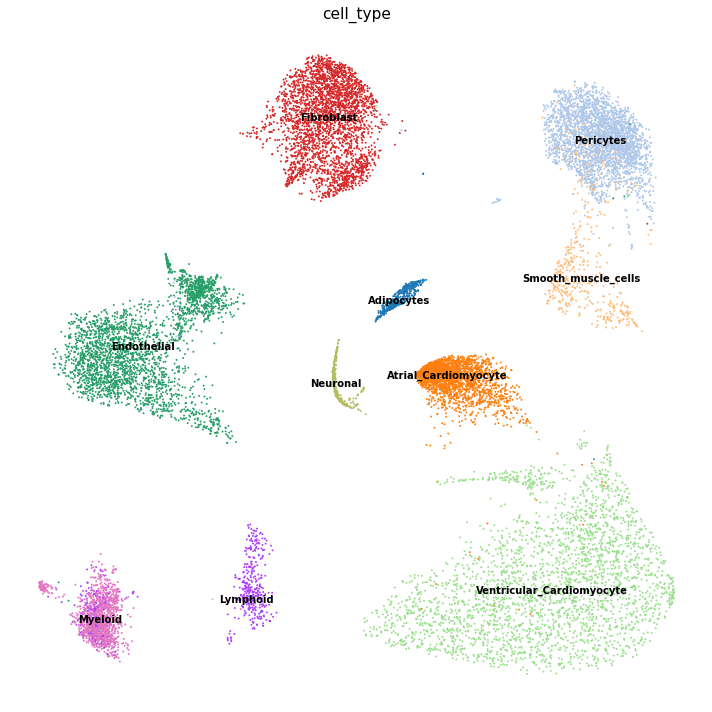

In [3]:
sns.set_context('paper',font_scale=1.6)
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.umap(
    ad_sc, color=cell_type_column, size=15, frameon=False, show=False, ax=axs,legend_loc='on data'
)
plt.tight_layout()

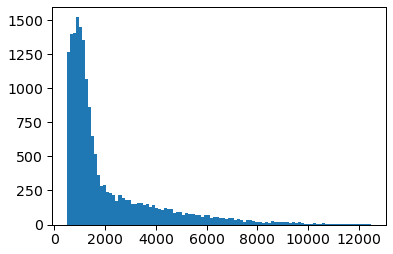

In [4]:
if ad_sc.X.max()<20:
    ad_sc.X = np.exp(ad_sc.X)-1
plt.hist(ad_sc.X.sum(1),bins=100)
plt.show()

In [5]:
ad_sc.raw = ad_sc.copy()
sc.pp.normalize_total(ad_sc,target_sum=2000)

sc.pp.highly_variable_genes(ad_sc, flavor='seurat_v3',n_top_genes=1000)
sc.tl.rank_genes_groups(ad_sc, groupby=cell_type_column, method='wilcoxon')
markers_df = pd.DataFrame(ad_sc.uns["rank_genes_groups"]["names"]).iloc[0:100, :]
markers = list(np.unique(markers_df.melt().value.values))
markers = list(set(ad_sc.var.loc[ad_sc.var['highly_variable']==1].index)|set(markers)) # highly variable genes + cell type marker genes

ligand_recept = list(set(pd.read_csv('../extdata/ligand_receptors.txt',sep='\t').melt()['value'].values))
# if scRNA-seq reference is from human tissue, run following code to make gene name consistent
ligand_recept = [_.upper() for _ in ligand_recept]
add_genes = 'DCN GSN PDGFRA\
RGS5 ABCC9 KCNJ8\
MYH11 TAGLN ACTA2\
GPAM FASN LEP\
MSLN WT1 BNC1\
VWF PECAM1 CDH5\
CD14 C1QA CD68\
CD8A IL7R CD40LG\
NPPA MYL7 MYL4\
MYH7 MYL2 FHL2\
DLC1 EBF1 SOX5\
FHL1 CNN1 MYH9\
CRYAB NDUFA4 COX7C\
PCDH7 FHL2 MYH7\
PRELID2 GRXCR2 AC107068.2\
MYH6 NPPA MYL4\
CNN1 MYH9 DUSP27\
CKM COX41L NDUFA4\
DLC1 PLA2GS MAML2\
HAMP SLIT3 ALDH1A2\
POSTN TNC FAP\
SCN7A BMPER ACSM1\
FBLN2 PCOLCE2 LINC01133\
CD36 EGFLAM FTL1\
CFH ID4 KCNT2\
PTX3 OSMR IL6ST\
DCN PTX3 C1QA\
NOTCH1 NOTCH2 NOTCH3 NOTCH4 DLL1 DLL4 JAG1 JAG2\
CDH5 SEMA3G ACKR1 MYH11'.split()+['TNNT2','PLN','MYH7','MYL2','IRX3','IRX5','MASP1'] # some important genes that we interested

markers = markers+add_genes+ligand_recept
len(markers)

2447

In [6]:
ad_sc.var.loc[ad_sc.var.index.isin(markers),'Marker'] = True
ad_sc.var['Marker'] = ad_sc.var['Marker'].fillna(False)
ad_sc.var['highly_variable'] = ad_sc.var['Marker']

sc.pp.log1p(ad_sc)
sc.pp.pca(ad_sc,svd_solver='arpack', n_comps=30, use_highly_variable=True)

ad_sc.X.max()

7.1928005

In [7]:
sc.pp.neighbors(ad_sc, metric='cosine', n_neighbors=30, n_pcs = 30)
sc.tl.umap(ad_sc, min_dist = 0.5, spread = 1, maxiter=60)

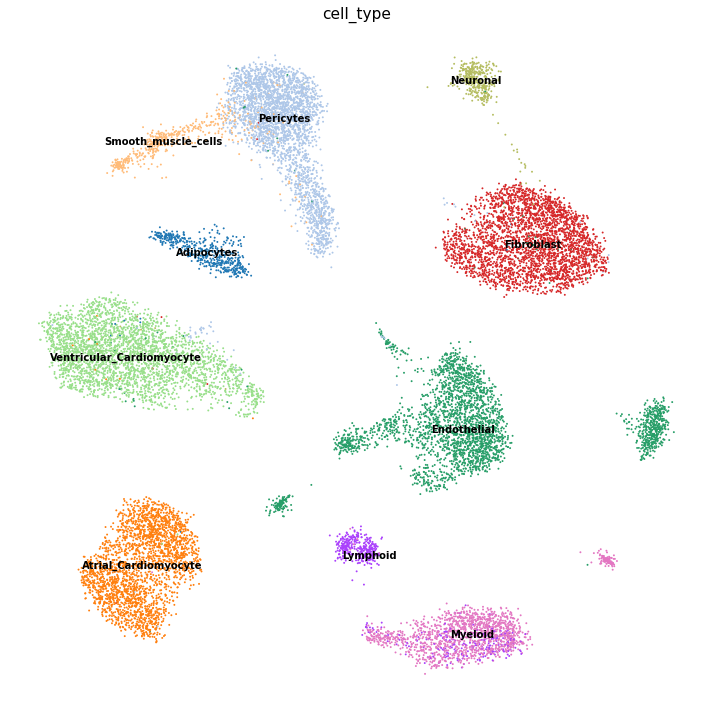

In [8]:
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.umap(
    ad_sc, color=cell_type_column, size=15, frameon=False, show=False, ax=axs,legend_loc='on data'
)
plt.tight_layout()

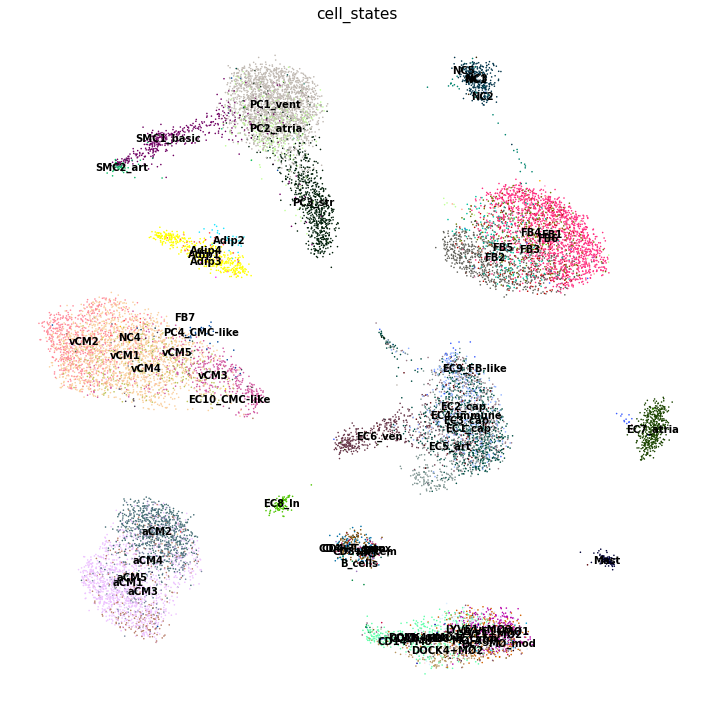

In [9]:
fig, axs = plt.subplots(1, 1, figsize=(10, 10))
sc.pl.umap(
    ad_sc, color="cell_states", size=10, frameon=False, show=False, ax=axs,legend_loc='on data'
)
plt.tight_layout()

In [10]:
#ad_sc.write('../Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad')

## Run SpatialScope 

#### Step1: Nuclei segmentation
```
python ./src/Nuclei_Segmentation.py --tissue heart --out_dir  ./output  --ST_Data ./demo_data/V1_Human_Heart_spatial.h5ad --Img_Data  ./demo_data/V1_Human_Heart_image.tif
```

#### Step2: Cell type identification
```
python ./src/Cell_Type_Identification.py --tissue heart --out_dir  ./output  --ST_Data ./output/heart/sp_adata_ns.h5ad --SC_Data ./Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad --cell_class_column cell_type
```

#### Step3: Gene expression decomposition

Limited by GPU memory, we can only handle at most about 1000 spots in 4 GPUs at a time, so we decompose 1000 spots at a time.

If you are only interested in the ROI region shown in the main text, you can perform gene expression decomposition on this ROI region only for the sake of time

```
python ./src/Decomposition.py --tissue heart --out_dir  ./output --SC_Data ./Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad --cell_class_column cell_type  --ckpt_path ./Ckpts_scRefs/Heart_D2/model_600001.pt --spot_range 0,1000 --gpu 0,1,2,3

python ./src/Decomposition.py --tissue heart --out_dir  ./output --SC_Data ./Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad --cell_class_column cell_type  --ckpt_path ./Ckpts_scRefs/Heart_D2/model_600001.pt --spot_range 1000,2000 --gpu 0,1,2,3

python ./src/Decomposition.py --tissue heart --out_dir  ./output --SC_Data ./Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad --cell_class_column cell_type  --ckpt_path ./Ckpts_scRefs/Heart_D2/model_600001.pt --spot_range 2000,3000 --gpu 0,1,2,3

python ./src/Decomposition.py --tissue heart --out_dir  ./output --SC_Data ./Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad --cell_class_column cell_type  --ckpt_path ./Ckpts_scRefs/Heart_D2/model_600001.pt --spot_range 3000,4000 --gpu 0,1,2,3

python ./src/Decomposition.py --tissue heart --out_dir  ./output --SC_Data ./Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad --cell_class_column cell_type  --ckpt_path ./Ckpts_scRefs/Heart_D2/model_600001.pt --spot_range 4000,4220 --gpu 0,1,2,3
```

## Cell type identification result at single-cell resolution for the whole slice (Fig a)

In [2]:
ad_sc = sc.read('../Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad')
ad_sp = sc.read('../output/heart/sp_adata.h5ad')

#### **cell_locations** will be added to .uns after Step 1 (nuclei segmention)

In [158]:
ad_sp.uns['cell_locations'].head()

,x,y,spot_index,cell_index,cell_nums,discrete_label,discrete_label_ct
0,9850.322581,8497.774194,AAACAAGTATCTCCCA-1,AAACAAGTATCTCCCA-1_0,3,2,Endothelial
1,9834.727626,8509.268482,AAACAAGTATCTCCCA-1,AAACAAGTATCTCCCA-1_1,3,9,Ventricular_Cardiomyocyte
2,9831.670886,8492.797468,AAACAAGTATCTCCCA-1,AAACAAGTATCTCCCA-1_2,3,9,Ventricular_Cardiomyocyte
3,4112.213235,9584.580882,AAACACCAATAACTGC-1,AAACACCAATAACTGC-1_0,4,3,Fibroblast
4,4074.684874,9610.348739,AAACACCAATAACTGC-1,AAACACCAATAACTGC-1_1,4,2,Endothelial


In [3]:
color_dict = {'Adipocytes': '#1f77b4',
 'Atrial_Cardiomyocyte': '#ff7f0e',
 'Endothelial': '#2ca02c',
 'Fibroblast': '#F5DE7E',
 'Lymphoid': '#9D9BC2',
 'Myeloid': '#8c564b',
 'Neuronal': '#D29D9E',
 'Pericytes': '#BDBDBD',
 'Smooth_muscle_cells': '#d62728',
 'Ventricular_Cardiomyocyte': '#7AA4C1'}

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:74: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


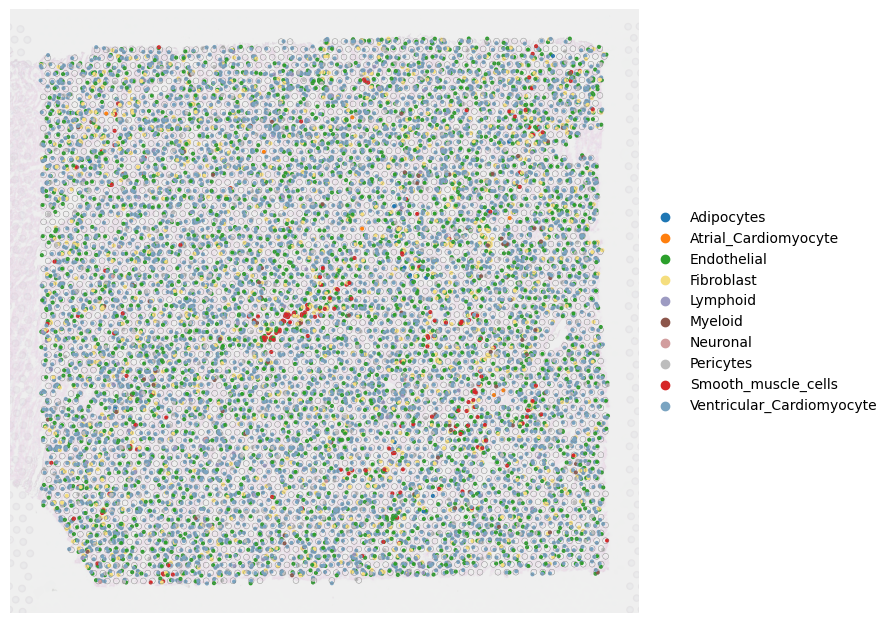

In [4]:
fig, ax = plt.subplots(1,1,figsize=(12, 8),dpi=100)
PlotVisiumCells(ad_sp,"discrete_label_ct",size=0.7,alpha_img=0.2,lw=0.3,palette=color_dict,ax=ax)

## Inferred cell type compositions (Fig b)

In [5]:
p2_res = ad_sp.uns['cell_locations']
ss = pd.DataFrame(p2_res.discrete_label_ct.value_counts()/p2_res.shape[0])
ss.columns = ['SpatialScope']


alignres_cytospace = pd.read_csv('/home/share/xiaojs/spatial/sour_sep/heart/res/cytospace/D2/cytospace_results/assigned_locations.csv')
cs = pd.DataFrame(alignres_cytospace['CellType'].value_counts()/alignres_cytospace.shape[0])
cs.columns = ['CytoSpace']

tg = pd.read_csv('/home/share/xiaojs/spatial/sour_sep/heart/res/Tangram_P2_D2Ref_nu10.csv',index_col=0)
tg = pd.DataFrame(tg['cluster'].value_counts()/tg.shape[0])
tg.columns = ['Tangram']

df_res = ss.merge(tg,left_index=True,right_index=True,how='outer').merge(cs,left_index=True,right_index=True,how='outer')

In [6]:
df_res = df_res.fillna(0).T

In [7]:
df_res

,Adipocytes,Atrial_Cardiomyocyte,Endothelial,Fibroblast,Lymphoid,Myeloid,Neuronal,Pericytes,Smooth_muscle_cells,Ventricular_Cardiomyocyte
SpatialScope,0.001846,0.000646,0.275337,0.109378,0.013661,0.009692,0.000738,0.063965,0.019476,0.505261
Tangram,0.014879,0.106452,0.203436,0.146896,0.014473,0.047207,0.012444,0.187204,0.016367,0.250642
CytoSpace,0.027632,0.000000,0.282416,0.131340,0.002153,0.000000,0.000000,0.001914,0.003230,0.551316


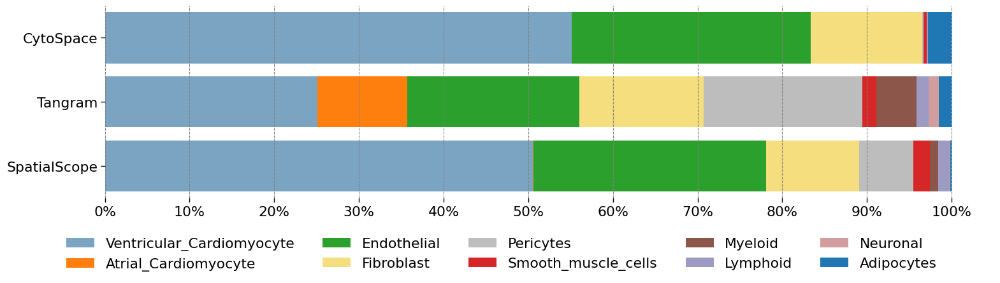

In [8]:
# variables
plot_columns = ['Ventricular_Cardiomyocyte','Atrial_Cardiomyocyte',
 'Endothelial',
 'Fibroblast',
 'Pericytes',
 'Smooth_muscle_cells',
 'Myeloid',
 'Lymphoid',
 'Neuronal',
 'Adipocytes']
plot_colors = [color_dict[_] for _ in plot_columns]

labels = plot_columns#df_res.columns
colors = plot_colors#['#1D2F6F', '#8390FA', '#6EAF46', '#FAC748']
title = 'Video Game Sales By Platform and Region\n'
subtitle = 'Proportion of Games Sold by Region'
def plot_stackedbar_p(df, labels, colors, title, subtitle):
    fields = labels#df.columns.tolist()
    
    # figure and axis
    sns.set_context('paper',font_scale=1.8) 
    fig, ax = plt.subplots(1, figsize=(18, 4),dpi=100)
# plot bars
    left = len(df) * [0]
    for idx, name in enumerate(fields):
        plt.barh(df.index, df[name], left = left, color=colors[idx])
        left = left + df[name]
# legend
    plt.legend(labels, bbox_to_anchor=([.95, -0.14, 0, 0]), ncol=5, frameon=False)
# remove spines
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
# format x ticks
    xticks = np.arange(0,1.1,0.1)
    xlabels = ['{}%'.format(i) for i in np.arange(0,101,10)]
    plt.xticks(xticks, xlabels)
# adjust limits and draw grid lines
    plt.ylim(-0.5, ax.get_yticks()[-1] + 0.5)
    ax.xaxis.grid(color='gray', linestyle='dashed')
plt.show()
    
plot_stackedbar_p(df_res, labels, colors, title, subtitle)

## UMAP of single cell reference data (Fig c)

#### scRef and sampled pseudo-cells

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


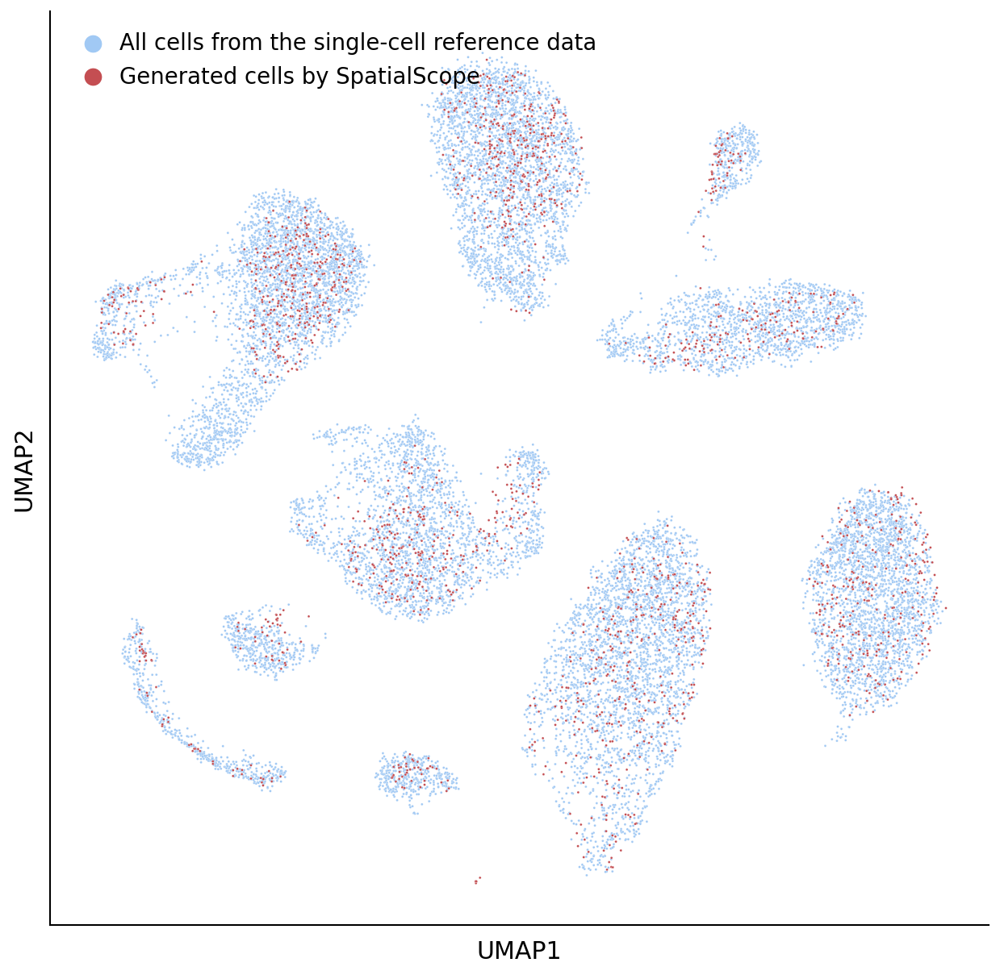

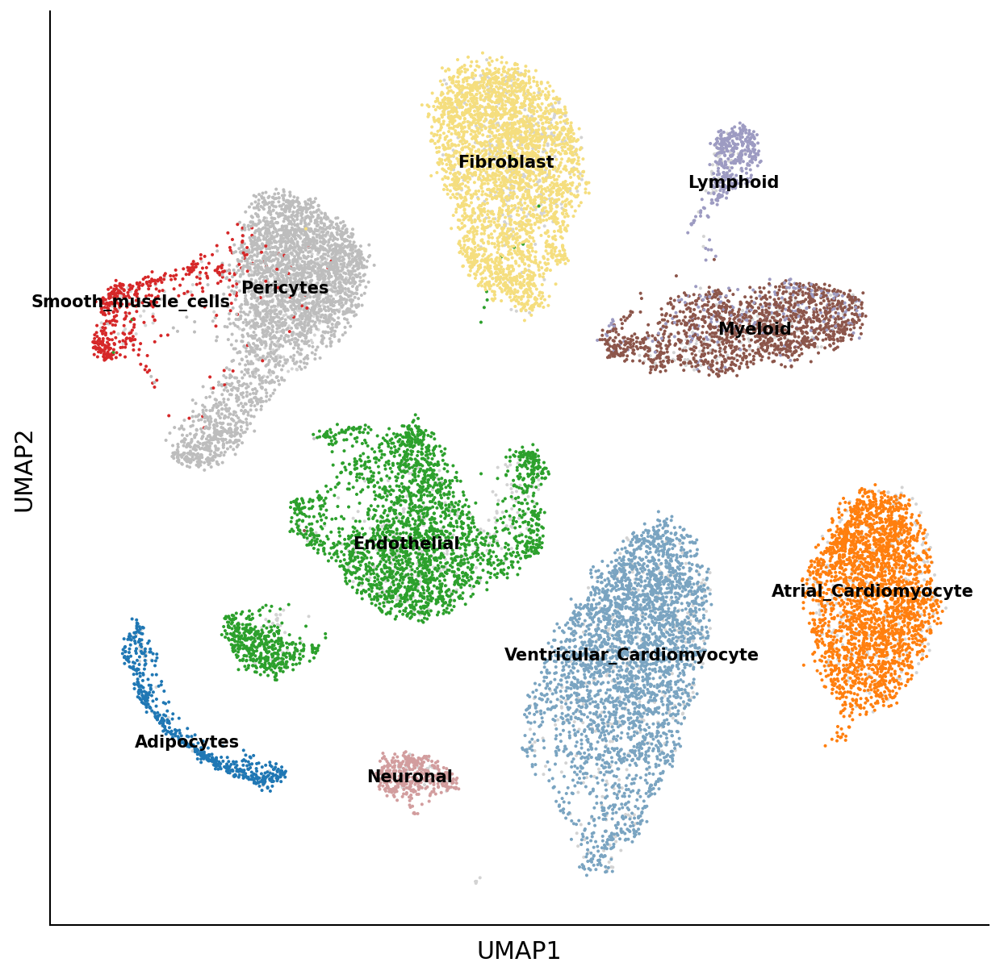

AnnData object with n_obs × n_vars = 19369 × 2195
    obs: 'NRP', 'age_group', 'cell_source', 'cell_type', 'donor', 'gender', 'n_counts', 'n_genes', 'percent_mito', 'percent_ribo', 'region', 'sample', 'scrublet_score', 'source', 'type', 'version', 'cell_states', 'Used', 'cell type', 'batch'
    var: 'gene_ids-Harvard-Nuclei', 'feature_types-Harvard-Nuclei', 'gene_ids-Sanger-Nuclei', 'feature_types-Sanger-Nuclei', 'gene_ids-Sanger-Cells', 'feature_types-Sanger-Cells', 'gene_ids-Sanger-CD45', 'feature_types-Sanger-CD45', 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'Marker', 'mean-0', 'std-0', 'mean-1', 'std-1'
    uns: 'neighbors', 'umap', 'cell_type_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [4]:
sampled_cells = sc.read('../Ckpts_scRefs/Heart_D2/model_600001.h5ad') # 2K cells sampled from the learned gene expression distribution of scRef
cell_type_key='cell_type'
sns.set_context('paper',font_scale=1.5)
adata_all = PlotSampledData(sampled_cells,ad_sc,cell_type_key,palette=color_dict)

## Cell type identification result at single-cell resolution in ROI (Fig d)

In [5]:
import squidpy as sq

In [6]:
image = plt.imread('../demo_data/V1_Human_Heart_image.tif')
img = sq.im.ImageContainer(image)

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/PIL/Image.py:3011: DecompressionBombWarning: Image size (177742224 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  warnings.warn(


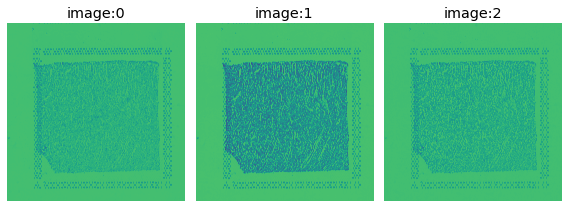

In [7]:
crop = img.crop_corner(0, 0)
crop.show(channelwise=True,layer='image')

In [155]:
crop

ImageContainer[shape=(13332, 13332), layers=['image']]

In [8]:
inset_x = int(img.shape[0]*(4.1/10)) # column
inset_y = int(img.shape[1]*(4.6/10)) # row
inset_sx = int(img.shape[0]*(2/10)) 
inset_sy = int(img.shape[1]*(1.6/10))

ad_sp_crop = ad_sp[
    (ad_sp.obsm["spatial"][:, 0] > inset_x) & (ad_sp.obsm["spatial"][:, 1] > inset_y)
    & (ad_sp.obsm["spatial"][:, 0] < inset_x+inset_sx) & (ad_sp.obsm["spatial"][:, 1] < inset_y+inset_sy), :
].copy()

In [14]:
ad_sp_crop.uns['cell_locations'] = ad_sp_crop.uns['cell_locations'].loc[ad_sp_crop.uns['cell_locations'].spot_index.isin(ad_sp_crop.obs.index)].reset_index(drop=True)

/import/home/jxiaoae/spatial/SpatialScope-Beta/demos/../src/utils.py:77: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  test = sc.AnnData(np.zeros(merged_df.shape), obs=merged_df)
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


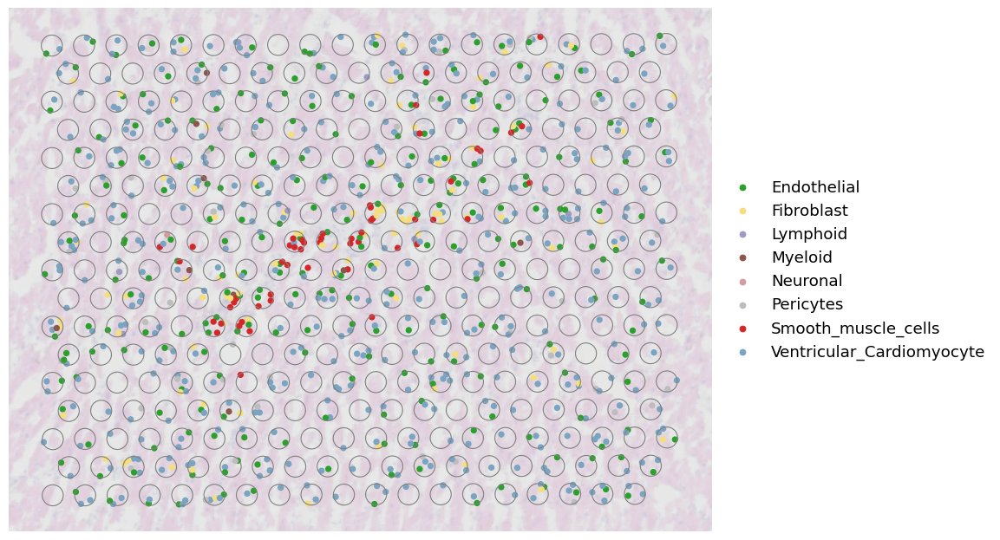

In [17]:
fig, ax = plt.subplots(1,1,figsize=(12, 8),dpi=100)
PlotVisiumCells(ad_sp_crop,"discrete_label_ct",size=0.3,alpha_img=0.3,lw=0.8,palette=color_dict,ax=ax)

## Expression of SMC and EC marker genes (Fig e)

We start by concatenating all the generated_cells_spotX-X.h5ad together.

If you are only interested in this ROI region, you can perform gene expression decomposition on this ROI region only for the sake of time

In [18]:
ad_scsts_list = []
ad_scsts_list.append(sc.read('../output/heart/generated_cells_spot0_1000.h5ad'))
ad_scsts_list.append(sc.read('../output/heart/generated_cells_spot1000_2000.h5ad'))
ad_scsts_list.append(sc.read('../output/heart/generated_cells_spot2000_3000.h5ad'))
ad_scsts_list.append(sc.read('../output/heart/generated_cells_spot3000_4000.h5ad'))
ad_scsts_list.append(sc.read('../output/heart/generated_cells_spot4000_4220.h5ad'))

ad_scsts = ad_scsts_list[0].concatenate(
        ad_scsts_list[1:],
        batch_key="_",
        uns_merge="unique",
        index_unique=None
        )

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],


In [25]:
ad_scst_crop = = ad_scsts[ad_scsts.obs['spot_index'].isin(ad_sp_crop.obs.index)]
# If you are only interested in this ROI region, you can perform gene expression decomposition on this ROI region only for the sake of time

In [123]:
ad_scst_crop.uns = ad_sp_crop.uns

In [124]:
ad_scst_crop

AnnData object with n_obs × n_vars = 873 × 2195
    obs: 'x', 'y', 'spot_index', 'cell_index', 'cell_nums', 'discrete_label', 'discrete_label_ct'
    uns: 'cell_locations', 'spatial', 'log1p'

In [125]:
ad_scst_crop.write('../demo_data/human_heart_ROI_generated_cells.h5ad')

In [126]:
ad_scst_crop.obs.head()

,x,y,spot_index,cell_index,cell_nums,discrete_label,discrete_label_ct
64,7384.721649,7905.711340,AAACTGCTGGCTCCAA-1,AAACTGCTGGCTCCAA-1_0,1,9,Ventricular_Cardiomyocyte
115,7521.504808,8177.100962,AAATACCTATAAGCAT-1,AAATACCTATAAGCAT-1_0,4,9,Ventricular_Cardiomyocyte
116,7567.760000,8129.320000,AAATACCTATAAGCAT-1,AAATACCTATAAGCAT-1_1,4,3,Fibroblast
117,7553.000000,8118.000000,AAATACCTATAAGCAT-1,AAATACCTATAAGCAT-1_2,4,2,Endothelial
118,7555.917355,8140.165289,AAATACCTATAAGCAT-1,AAATACCTATAAGCAT-1_3,4,9,Ventricular_Cardiomyocyte


In [127]:
ad_sp_crop.X.max(),ad_scst_crop.X.max()

(420.0001, 1381.0935)

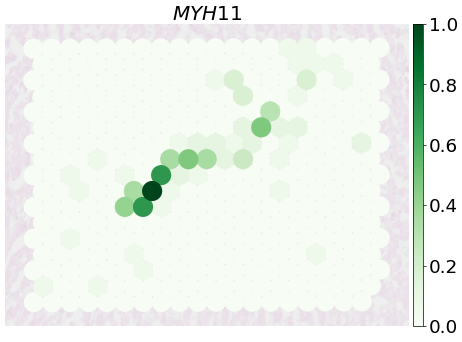

In [128]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_sp_crop,'MYH11',ax=ax,size=1.7,alpha_img=0.2,palette='Greens')

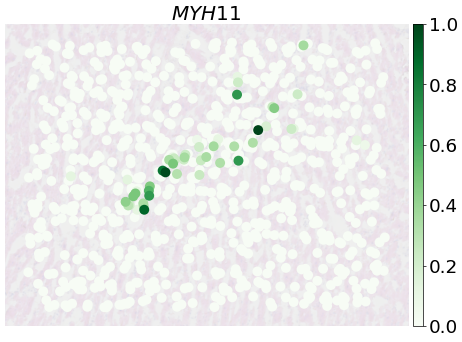

In [129]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_scst_crop,'MYH11',ax=ax,size=2.5,alpha_img=0.2,palette='Greens')

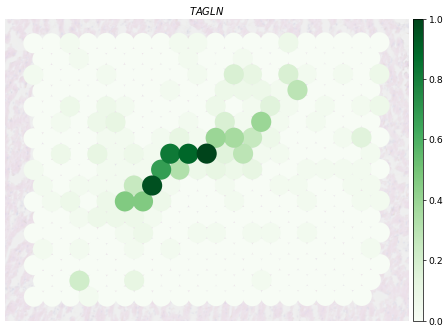

In [71]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_sp_crop,'TAGLN',ax=ax,size=1.7,alpha_img=0.2,palette='Greens')

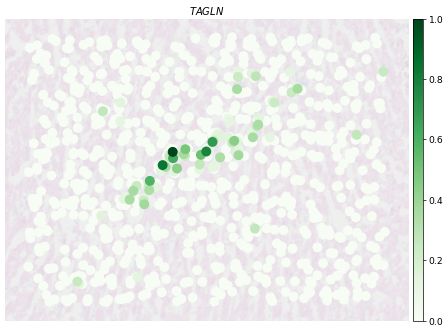

In [72]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_scst_crop,'TAGLN',ax=ax,size=2.5,alpha_img=0.2,palette='Greens')

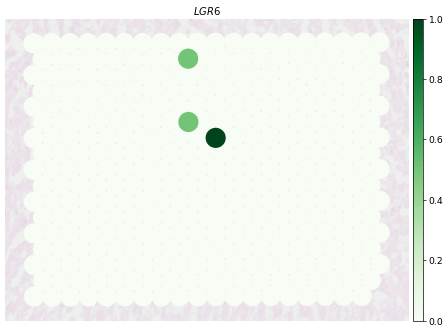

In [73]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_sp_crop,'LGR6',ax=ax,size=1.7,alpha_img=0.2,palette='Greens')

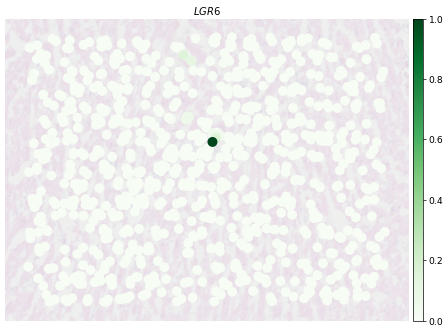

In [74]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_scst_crop,'LGR6',ax=ax,size=2.5,alpha_img=0.2,palette='Greens')

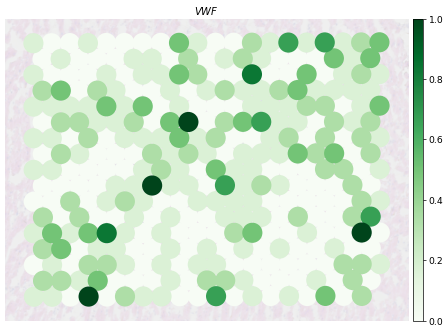

In [76]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_sp_crop,'VWF',ax=ax,size=1.7,alpha_img=0.2,palette='Greens')

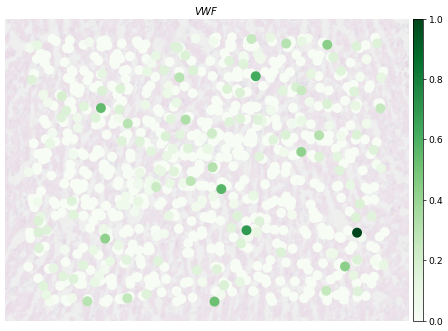

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_scst_crop,'VWF',ax=ax,size=2.5,alpha_img=0.2,palette='Greens')

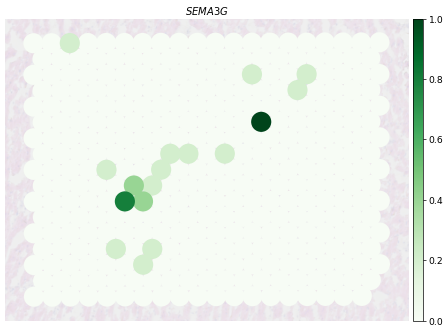

In [78]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_sp_crop,'SEMA3G',ax=ax,size=1.7,alpha_img=0.2,palette='Greens')

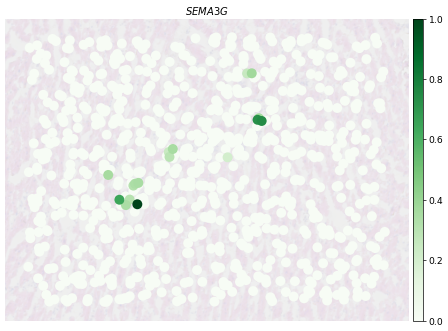

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(12, 8),dpi=50)
PlotVisiumGene(ad_scst_crop,'SEMA3G',ax=ax,size=2.5,alpha_img=0.2,palette='Greens')

## SpatialScope inferred SMCs (Fig f)

In [130]:
ad_scst_crop = sc.read('../demo_data/human_heart_ROI_generated_cells.h5ad')

In [131]:
smscells_gx = ad_scst_crop[ad_scst_crop.obs['discrete_label_ct']=='Smooth_muscle_cells'].copy()
smscells_gx.obs['cell_type'] = 'Generated_SMC_Cells'
smscells_gx.obs['cell_states'] = 'Generated_SMC_Cells'
sc.pp.log1p(smscells_gx)

ad_sc = sc.read('../Ckpts_scRefs/Heart_D2/Ref_Heart_sanger_D2.h5ad')
ad_sc = ad_sc[ad_sc.obs['cell_type'].isin(['Endothelial','Smooth_muscle_cells'])]
ad_sc = ad_sc[~ad_sc.obs['cell_states'].isin(['EC4_immune','EC10_CMC-like','EC9_FB-like','EC8_ln'])]
ad_sc = ad_sc[:,ad_sc.var.Marker]
rename_dict = {
    'EC1_cap':'EC_cap',
    'EC3_cap':'EC_cap',
    'EC2_cap':'EC_cap'
}

ad_sc.obs['cell_states'] = ad_sc.obs['cell_states'].map(lambda x:rename_dict[x] if x in rename_dict.keys() else x)

/home/share/xiaojs/software/netMHCpan-4.1/Linux_x86_64/tmp/ipykernel_37314/3122457914.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  ad_sc.obs['cell_states'] = ad_sc.obs['cell_states'].map(lambda x:rename_dict[x] if x in rename_dict.keys() else x)


In [89]:
ad_sc.X.max(),smscells_gx.X.max()

(6.9823365, 6.4401555)

In [90]:
ad_sc.uns['log1p']['base'] = None
sc.pp.highly_variable_genes(ad_sc, n_top_genes=500)
sc.tl.pca(ad_sc, n_comps=30, use_highly_variable=True)

pcs = ad_sc.varm['PCs']
smscells_gx.obsm['X_pca'] = (smscells_gx.X - ad_sc.X.mean(0)) @ pcs

adata_all = ad_sc.concatenate(smscells_gx)

adata_all.varm['PCs'] = pcs
adata_all.raw = adata_all
sc.pp.neighbors(adata_all, n_neighbors=20, n_pcs=30)
sc.tl.umap(adata_all, min_dist = 0.5, spread = 1., maxiter = 50)

/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/merge.py:942: UserWarning: Only some AnnData objects have `.raw` attribute, not concatenating `.raw` attributes.
  warn(
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/jxiaoae/.conda/envs/SpatialScope/lib/python3.9/site-packages/sklearn/utils/validation.py:727: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


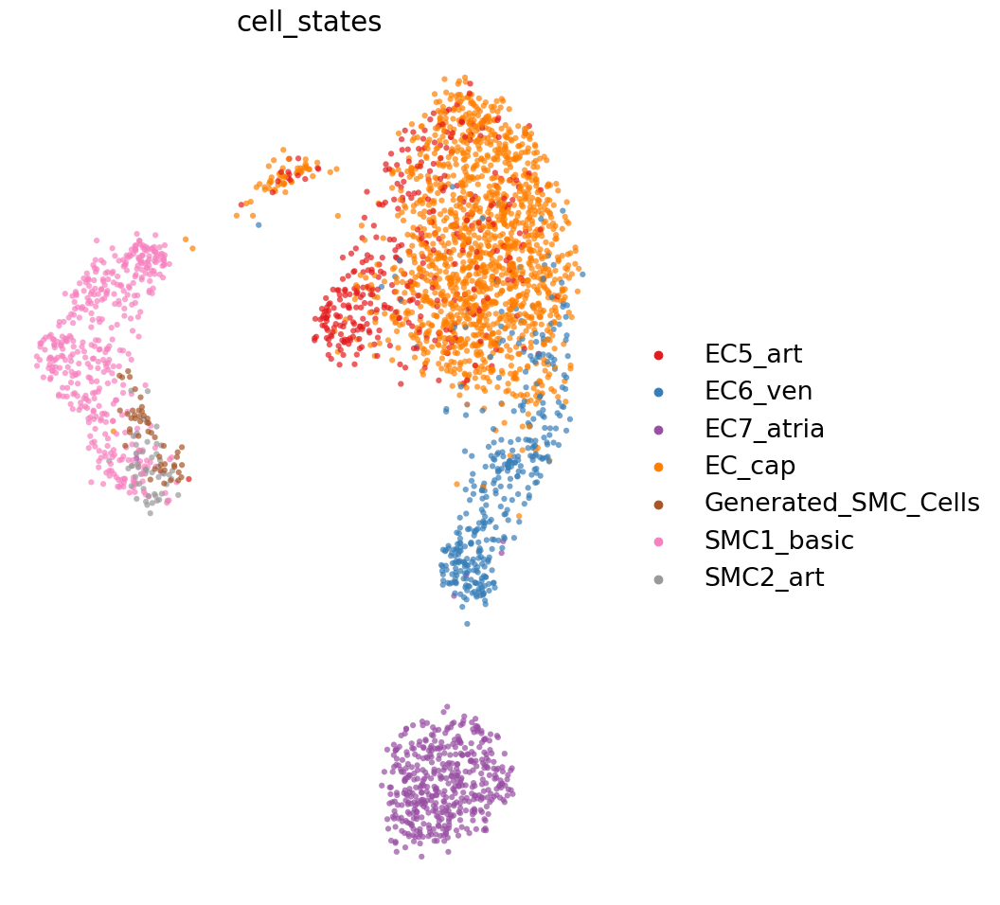

In [91]:
fig, axs = plt.subplots(1, 1, figsize=(11, 10),dpi=100)
plt.rcParams["legend.markerscale"] = 1.3
sns.set_context('paper',font_scale=2.2) 
sc.pl.umap(
    adata_all, color="cell_states", size=80, frameon=False, palette='Set1', alpha=0.7, show=False, ax=axs#,legend_loc='on data'
)
plt.tight_layout()

## Cellular communications detected from SpatialScope generated single-cell resolution spatial data (Fig g)

In [150]:
ad_scst_crop = sc.read('../demo_data/human_heart_ROI_generated_cells.h5ad')
ad_scst_crop.to_df().T.to_csv('../output/heart/express.txt', sep='\t')
ad_scst_crop.obs.loc[:,['x', 'y']].to_csv('../output/heart/coords.txt', sep='\t', index = False)
ad_scst_crop.obs['discrete_label_ct'].to_csv('../output/heart/cell_type.txt', sep='\t', index = False, header = False)

#### see Human-Heart-CCell-interaction.ipynb or Human heart cell-cell interaction analysis using Giotto section

### Fig h

Figure h was drawn by our first author, a painting lover, Xiaomeng

### Representative examples (Fig i)

In [132]:
ad_scst_crop = sc.read('../demo_data/human_heart_ROI_generated_cells.h5ad')

In [133]:
ad_scst_crop

AnnData object with n_obs × n_vars = 873 × 2195
    obs: 'x', 'y', 'spot_index', 'cell_index', 'cell_nums', 'discrete_label', 'discrete_label_ct'
    uns: 'cell_locations', 'log1p', 'spatial'

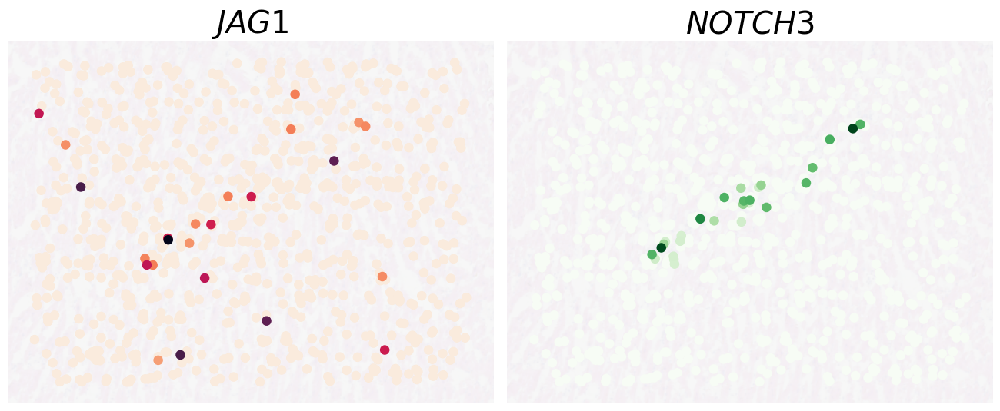

In [146]:
gene_L,gene_R,celltype_L,celltype_R = 'JAG1','NOTCH3','Endothelial','Smooth_muscle_cells'
L_ct_index = ad_scst_crop.obs['discrete_label_ct'].isin(np.array([celltype_L]))
R_ct_index = ad_scst_crop.obs['discrete_label_ct'].isin(np.array([celltype_R]))

sns.set_context('paper',font_scale=3)
fig, ax = plt.subplots(1,2,figsize=(13, 5),dpi=100)
PlotVisiumGene(ad_scst_crop, gene_L, size=2,alpha_img=0.1,perc=0.0,palette='rocket_r',ax=ax[0],vis_index = np.array(L_ct_index),colorbar_loc=None)
PlotVisiumGene(ad_scst_crop, gene_R, size=2,alpha_img=0.1,perc=0.0,palette='Greens',ax=ax[1],vis_index = np.array(R_ct_index),colorbar_loc=None)
fig.tight_layout(pad=0.03)
plt.show()

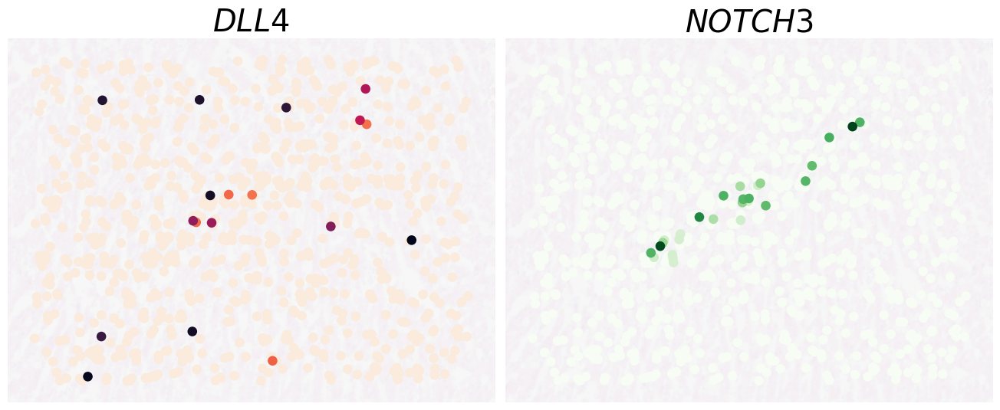

In [147]:
gene_L,gene_R,celltype_L,celltype_R = 'DLL4','NOTCH3','Endothelial','Smooth_muscle_cells'
L_ct_index = ad_scst_crop.obs['discrete_label_ct'].isin(np.array([celltype_L]))
R_ct_index = ad_scst_crop.obs['discrete_label_ct'].isin(np.array([celltype_R]))

sns.set_context('paper',font_scale=3)
fig, ax = plt.subplots(1,2,figsize=(13, 5),dpi=100)
PlotVisiumGene(ad_scst_crop, gene_L, size=2,alpha_img=0.1,perc=0.0,palette='rocket_r',ax=ax[0],vis_index = np.array(L_ct_index),colorbar_loc=None)
PlotVisiumGene(ad_scst_crop, gene_R, size=2,alpha_img=0.1,perc=0.0,palette='Greens',ax=ax[1],vis_index = np.array(R_ct_index),colorbar_loc=None)
fig.tight_layout(pad=0.03)
plt.show()

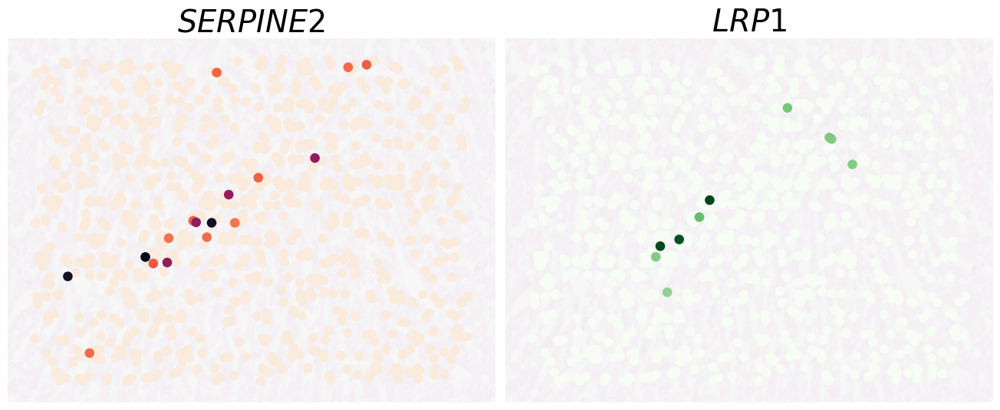

In [148]:
gene_L,gene_R,celltype_L,celltype_R = 'SERPINE2','LRP1','Endothelial','Smooth_muscle_cells'
L_ct_index = ad_scst_crop.obs['discrete_label_ct'].isin(np.array([celltype_L]))
R_ct_index = ad_scst_crop.obs['discrete_label_ct'].isin(np.array([celltype_R]))

sns.set_context('paper',font_scale=3)
fig, ax = plt.subplots(1,2,figsize=(13, 5),dpi=100)
PlotVisiumGene(ad_scst_crop, gene_L, size=2,alpha_img=0.1,perc=0.0,palette='rocket_r',ax=ax[0],vis_index = np.array(L_ct_index),colorbar_loc=None)
PlotVisiumGene(ad_scst_crop, gene_R, size=2,alpha_img=0.1,perc=0.0,palette='Greens',ax=ax[1],vis_index = np.array(R_ct_index),colorbar_loc=None)
fig.tight_layout(pad=0.03)
plt.show()